<a href="https://colab.research.google.com/github/GnanaRaphaelina/YOLOv5ParkingOccupancy/blob/main/Yolov5_ParkingOccupancy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Install Requirements

In [ ]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  #clone repo
%cd yolov5
%pip install -qr requirements.txt  #install dependencies.txt
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output   # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 14041, done.
remote: Counting objects: 100% (59/59), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 14041 (delta 35), reused 43 (delta 23), pack-reused 13982
Receiving objects: 100% (14041/14041), 13.30 MiB | 17.59 MiB/s, done.
Resolving deltas: 100% (9692/9692), done.
/content/yolov5
     |████████████████████████████████| 1.6 MB 41.4 MB/s 
     |████████████████████████████████| 178 kB 34.6 MB/s 
     |████████████████████████████████| 1.1 MB 48.7 MB/s 
     |████████████████████████████████| 54 kB 2.6 MB/s 
     |████████████████████████████████| 138 kB 55.9 MB/s 
     |████████████████████████████████| 145 kB 55.8 MB/s 
     |████████████████████████████████| 67 kB 6.4 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
Setup complete. Using torch 1.12.1+cu113 (Tesla T4)


Setup DataSet

In [ ]:
from roboflow import Roboflow
rf = Roboflow(model_format="yolov5", notebook="ultralytics")

upload and label your dataset, and get an API KEY here: https://app.roboflow.com/?model=yolov5&ref=ultralytics


In [ ]:
#set up environment
os.environ["DATASET_DIRECTORY"] = "/content/datasets"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="UvS6k5sk5RbRqNZErO6V")
project = rf.workspace('tiny-yolo-v4-y89yh').project("cnn-hack")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to /content/datasets/cnn-hack-1 in yolov5pytorch:: 100%|██████████| 2250/2250 [00:01<00:00, 1682.50it/s]


Train our Custom YOLOv5 model

In [ ]:
!python train.py --img 416 --batch 16 --epochs 300 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

# img - define input image size
#batch - determine batch size
#epochs - define the number of training epochs
#data - Our dataset location is saved in the dataset.location
#weights - specify a path to weights to start transfer learning from. we have chosen COCO pretrained checkpoint
#cache - cache images for faster training

train: weights=yolov5s.pt, cfg=, data=/content/datasets/cnn-hack-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=300, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.

In [ ]:
!cp -r "/content/yolov5" "/content/drive/MyDrive"

In [ ]:
!cp -r "/content/datasets" "/content/drive/MyDrive"

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

Run Inference

In [ ]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source {dataset.location}/test/images --line-thickness 1

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/datasets/cnn-hack-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=1, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v6.2-195-gdf80e7c Python-3.7.14 torch-1.12.1+cu113 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 157 layers, 7018216 parameters, 0 gradients, 15.8 GFLOPs
image 1/47 /content/datasets/cnn-hack-1/test/images/parking-002_jpeg.rf.7377ae04a70455d8ad608ad248127074.jpg: 416x416 19 emptys, 12 parkeds, 8.2ms
image 2/47 /content/datasets/cnn-hack-1/test/images/parking-015_jpeg.rf.ccb71fc4b53bd9c8e8ae169dcbb07525.jpg: 416x416 17 emptys, 12 parkeds, 8.6ms
image 3/47 /content/datasets/cnn

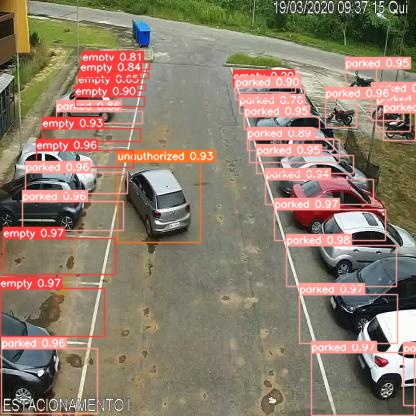

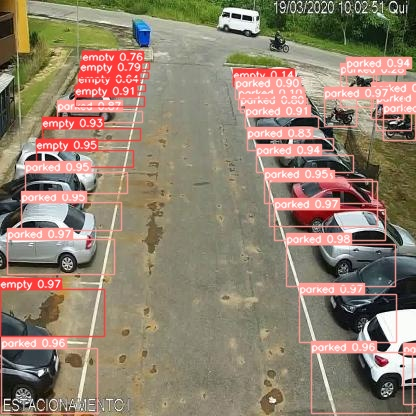

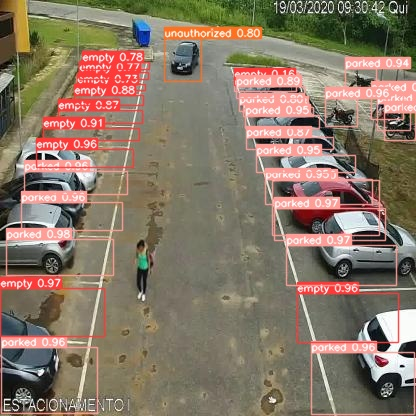

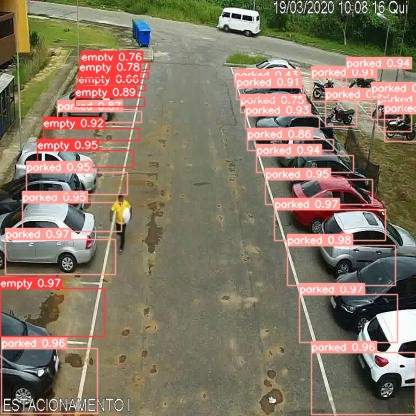

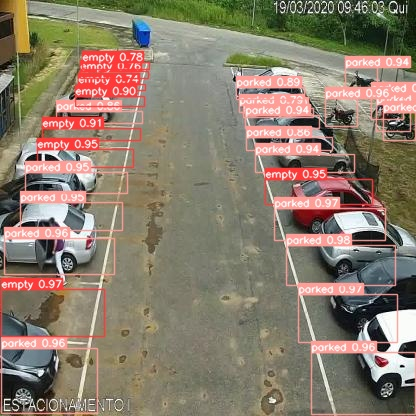

...

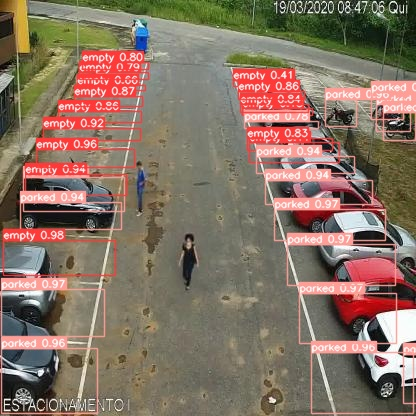

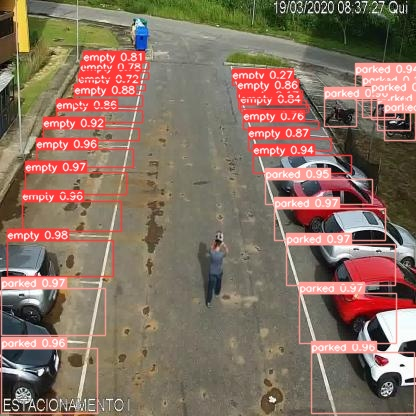

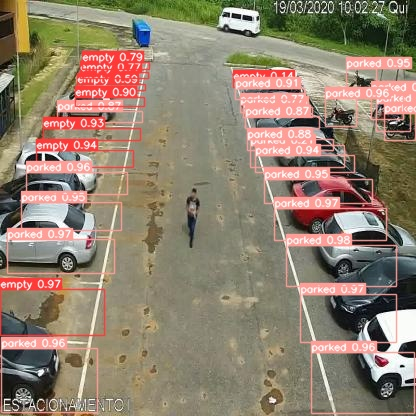

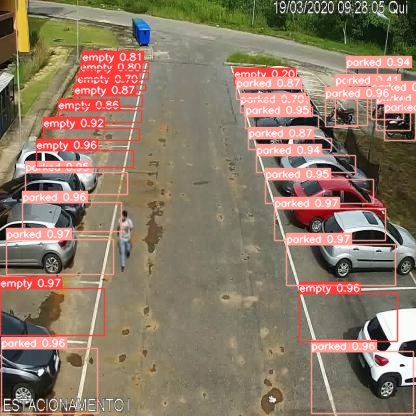

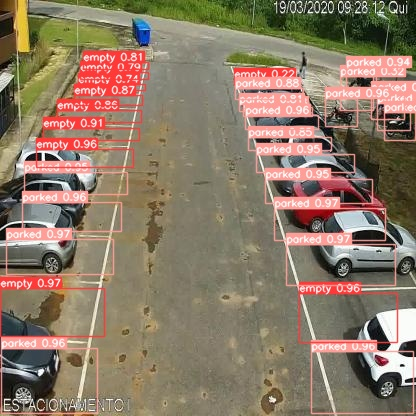

In [ ]:
#display inference on ALL test images

import glob
from IPython.display import Image,display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):
  display(Image(filename=imageName))
  print("\n")